In [27]:
#################################################################################################################################
################################################ MILESTONE PROJECT - PART 1 ######################################################

#1. Create Pandas dataframes 
#2. Manipulate data (indexing, selection, variable dtypes)conca

#3. Plot data (Matplotlib, Bokeh)


In [28]:
#Load all libraries that will be used in this project 

%matplotlib inline
import matplotlib
import seaborn as sns
matplotlib.rcParams['savefig.dpi'] = 144

In [29]:
import pandas as pd
import json 
from io import StringIO
import io
import csv
import sys
import datetime

In [30]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re

In [31]:
from bokeh.plotting import figure, show
from bokeh.io import output_notebook
from bokeh.palettes import Spectral6
from bokeh.resources import CDN
from bokeh.embed import file_html
from ipywidgets import *


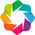

In [32]:
from matplotlib import cm
import holoviews as hv
hv.extension('bokeh', 'matplotlib')

In [33]:
#create a dataframe

df1 = pd.DataFrame({
    'id':[1,2,3,4,5,6,7,8,9,10,11],
    'number': ['16.30', '17.20', '17.70','16.30','17.90','15.90','16.00','18.12','16.40','17.00','16.32'],
    'response':[0,1,1,0,0,1,0,1,0,0,0]},
    index=[1,2,3,4,5,6,7,8,9,10,11])

In [34]:
#Indexing dataframes by 'id'

df1.set_index(['id']).head(11)

,number,response
id,,
1,16.30,0
2,17.20,1
3,17.70,1
4,16.30,0
5,17.90,0
6,15.90,1
7,16.00,0
8,18.12,1
9,16.40,0


In [35]:
#Let's create a new variable 'date' from current year and range from 2005 to 2015. Then I'll add this new column to each dataframe

year = datetime.datetime.today().year
date = range(2005,year-2)
date

#Also, can create a new variable date which years ranging between 2005 and 2015 as:
#date = pd.date_range('2005', '2016', freq='A')

[2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015]

In [36]:
#Convert list to an array with float format

date = np.array(date, dtype=np.float32)
date

array([ 2005.,  2006.,  2007.,  2008.,  2009.,  2010.,  2011.,  2012.,
        2013.,  2014.,  2015.], dtype=float32)

In [37]:
#Sort by reverse index
#df1.sort_index(ascending=False).head(11)

In [38]:
#Define object length using the the variable 'number' as reference

sLength = len(df1['number'])

#Add the new variable 'date' to each dataframe

df1['date'] = date

In [39]:
#Sort by'number' values 

df1.sort_values('number').head(11)

,id,number,response,date
6,6,15.90,1,2010.0
7,7,16.00,0,2011.0
1,1,16.30,0,2005.0
4,4,16.30,0,2008.0
11,11,16.32,0,2015.0
9,9,16.40,0,2013.0
10,10,17.00,0,2014.0
2,2,17.20,1,2006.0
3,3,17.70,1,2007.0
5,5,17.90,0,2009.0


In [40]:
#convert the variable 'number' to float64
df1[['number']] = df1[['number']].astype('float')

#convert the variable 'year' to int
df1[['date']] = df1[['date']].astype('int')
#output['date'] = pd.to_datetime(output['date'])
#output['date'] = output['date'].apply(lambda x: x.strftime('%Y'))

#Convert "response" variable to boolean
df1[['response']] = df1[['response']].astype('bool') #Also: #output['response'].astype(str).astype(int)
                                                                 #pd.factorize(output['response'])[0]

In [41]:
#see dtype objects
df1.dtypes

id            int64
number      float64
response       bool
date          int64
dtype: object

In [42]:
df1

,id,number,response,date
1,1,16.30,False,2005
2,2,17.20,True,2006
3,3,17.70,True,2007
4,4,16.30,False,2008
5,5,17.90,False,2009
6,6,15.90,True,2010
7,7,16.00,False,2011
8,8,18.12,True,2012
9,9,16.40,False,2013
10,10,17.00,False,2014


In [43]:
df1.set_index(['date']).head(11)

,id,number,response
date,,,
2005,1,16.30,False
2006,2,17.20,True
2007,3,17.70,True
2008,4,16.30,False
2009,5,17.90,False
2010,6,15.90,True
2011,7,16.00,False
2012,8,18.12,True
2013,9,16.40,False


In [44]:
from ipywidgets import interact
import numpy as np

from bokeh.io import push_notebook
from bokeh.plotting import figure, show, output_notebook

In [45]:
x = df1['date']
y = df1['number']
output_notebook()

Loading BokehJS ...

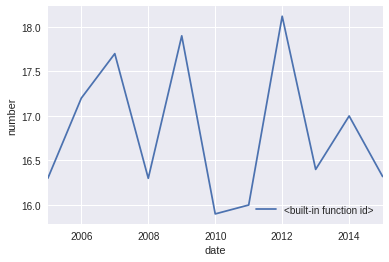

In [46]:
#Plot number vs date using matplotlib

from matplotlib import pylab as plt
df1.sort_values(by='date').plot(x='date', y='number', label=id)
plt.ylabel("number")
plt.legend(loc='lower right')

In [47]:
#Use Bokeh to create an interactive plot of the temporal trend

output_notebook()  
TOOLS = "pan, box_zoom, wheel_zoom, reset, save"

p = figure(tools=TOOLS,title="Temporal trend", plot_height=300, plot_width=600, y_range=(15,20),x_axis_label="date")
r = p.line(x, y, color="#2222aa", line_width=3)
show(p)

Loading BokehJS ...

In [48]:
#Create two additional dataframes

df2 = pd.DataFrame({
    'id':[12,13,14,15,16,17,18,19,20,21,22],
    'number': ['18.00', '18.20', '16.90','17.10','16.60','17.50','17.60','17.62','17.30','16.50','17.12'],
    'response':[1,1,0,0,1,0,0,1,1,0,1]},
    index=[11,12,13,14,15,16,17,18,19,20,21])

df3 = pd.DataFrame({
    'id':[23,24,25,26,27,28,29,30,31,32,33],
    'number': ['16.00', '15.88', '17.30','15.90','16.00','17.10','16.60','15.92','16.30','16.10','17.42'],
    'response':[1,0,0,1,1,0,1,0,1,1,0]},
    index=[22,23,24,25,26,27,28,29,30,31,32])

In [49]:
#Indexing dataframes by 'id'

df2.set_index(['id']).head(11)

,number,response
id,,
12,18.00,1
13,18.20,1
14,16.90,0
15,17.10,0
16,16.60,1
17,17.50,0
18,17.60,0
19,17.62,1
20,17.30,1


In [50]:
df3.set_index(['id']).head(11)

,number,response
id,,
23,16.00,1
24,15.88,0
25,17.30,0
26,15.90,1
27,16.00,1
28,17.10,0
29,16.60,1
30,15.92,0
31,16.30,1


In [51]:
#Define object length using the the variable 'number' as reference

sLength = len(df1['number'])

#Add the new variable 'date' to each dataframe

df2['date'] = date
df3['date'] = date

In [52]:
#Concatenate the three dataframes

dfs = [df1, df2, df3]
output = pd.concat(dfs)

#Also, can use merge to combine the three dataframes  
#output_join= output.merge(output, on='date', how='left')
#output_join.head(33)

In [53]:
#convert the variable 'number' to float64
output[['number']] = output[['number']].astype('float')

#convert the variable 'year' to int
output[['date']] = output[['date']].astype('int')

#Convert "response" variable to boolean True/False
output[['response']] = output[['response']].astype('bool') 

In [54]:
#Indexing by date

output.set_index(['date']).head(33)

,id,number,response
date,,,
2005,1,16.30,False
2006,2,17.20,True
2007,3,17.70,True
2008,4,16.30,False
2009,5,17.90,False
2010,6,15.90,True
2011,7,16.00,False
2012,8,18.12,True
2013,9,16.40,False


In [55]:
#A short description of the variable "number" in the combined dataframes

print "Numbers between 2005 and 2015"
output['number'].describe()

Numbers between 2005 and 2015


count    33.000000
mean     16.851515
std       0.733468
min      15.880000
25%      16.300000
50%      16.900000
75%      17.420000
max      18.200000
Name: number, dtype: float64

In [56]:
#select column 'number' and sum all its values

sum_numb= output['number'].sum()
sum_numb

556.09999999999991

In [57]:
#How many unique values are there in the dataframe?

output['number'].unique()[:11]

array([ 16.3 ,  17.2 ,  17.7 ,  17.9 ,  15.9 ,  16.  ,  18.12,  16.4 ,
        17.  ,  16.32,  18.  ])

In [58]:
#How many cases of each value are there?
output['number'].value_counts().head(33)

16.00    3
16.30    3
17.30    2
17.10    2
15.90    2
16.60    2
17.42    1
15.92    1
17.00    1
18.00    1
18.12    1
17.50    1
18.20    1
16.50    1
17.60    1
17.62    1
17.70    1
17.90    1
15.88    1
16.90    1
16.10    1
17.12    1
16.32    1
17.20    1
16.40    1
Name: number, dtype: int64

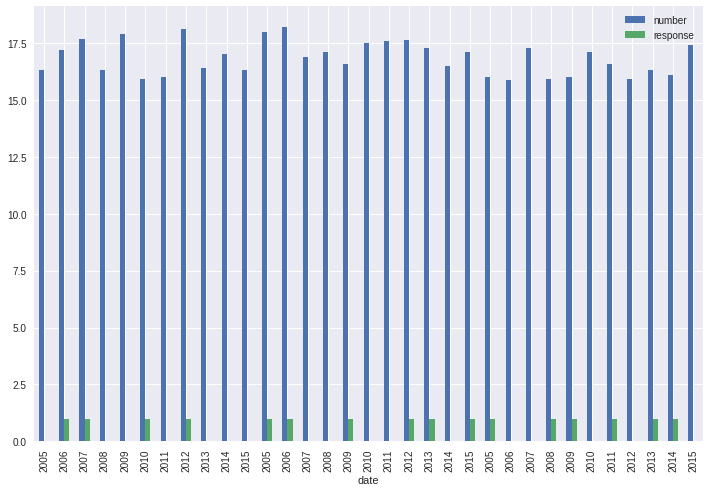

In [59]:
output.plot(x="date", y=["number", "response"],  figsize=(12, 8), kind="bar")

In [60]:
#Assign axis names to each dataframe
output = pd.concat(dfs, keys=['x', 'y', 'z'])
output

id number  response    date
x 1    1   16.3         0  2005.0
  2    2   17.2         1  2006.0
  3    3   17.7         1  2007.0
  4    4   16.3         0  2008.0
  5    5   17.9         0  2009.0
  6    6   15.9         1  2010.0
  7    7     16         0  2011.0
  8    8  18.12         1  2012.0
  9    9   16.4         0  2013.0
  10  10     17         0  2014.0
  11  11  16.32         0  2015.0
y 11  12  18.00         1  2005.0
  12  13  18.20         1  2006.0
  13  14  16.90         0  2007.0
  14  15  17.10         0  2008.0
  15  16  16.60         1  2009.0
  16  17  17.50         0  2010.0
  17  18  17.60         0  2011.0
  18  19  17.62         1  2012.0
  19  20  17.30         1  2013.0
  20  21  16.50         0  2014.0
  21  22  17.12         1  2015.0
z 22  23  16.00         1  2005.0
  23  24  15.88         0  2006.0
  24  25  17.30         0  2007.0
  25  26  15.90         1  2008.0
  26  27  16.00         1  2009.0
  27  28  17.10         0  2010.0
  28  29  16.60         1  2011.0
  29  30  15.92         0  2012.0
  30  31  16.30         1  2013.0
  31  32  16.10         1  2014.0
  32  33  17.42         0  2015.0

In [61]:
#################################################################################################################################
################################################ MILESTONE PROJECT - PART 2 ######################################################

#1. Request data from public API using request and simplejson libraries 
#2. Convert jSon data to Pandas dataframe
#3. Create table and plotting data (Bokeh, Holoviews)


In [62]:
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
matplotlib.rcParams['savefig.dpi'] = 144

In [63]:
import pandas as pd
import json 
from io import StringIO
import io
import csv
import sys
import datetime
import numpy as np
import re


In [64]:
import simplejson as json
import urllib2
import requests
import ujson as json


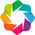

In [65]:
import holoviews as hv
hv.extension('bokeh', 'matplotlib')
from bokeh.plotting import figure, show
from bokeh.io import output_notebook
from bokeh.palettes import Spectral6
from ipywidgets import *

In [66]:
#Request search of jobless rate in USA between 1980 and 2016
#API Keys parameters can be found at: http://blog.inqubu.com/inqstats-open-api-published-to-get-demographic-data

r = requests.get('http://inqstatsapi.inqubu.com?api_key=c0081761e5b8e007&data=jobless_rate&countries=us&years=1980:2016')
r

<Response [200]>

In [67]:
print(r.content)

[
    {
        "countryCode": "us",
        "countryName": "USA",
        "jobless_rate": [
            {
                "year": "2014",
                "data": "6.20"
            },
            {
                "year": "2013",
                "data": "7.40"
            },
            {
                "year": "2012",
                "data": "8.20"
            },
            {
                "year": "2011",
                "data": "9.00"
            },
            {
                "year": "2010",
                "data": "9.70"
            },
            {
                "year": "2009",
                "data": "9.40"
            },
            {
                "year": "2008",
                "data": "5.90"
            },
            {
                "year": "2007",
                "data": "4.70"
            },
            {
                "year": "2006",
                "data": "4.70"
            },
            {
                "year": "2005",
                "data": "5.20"
  

In [68]:
data = r.json()
print(type(data))
print(data)

<type 'list'>
[{u'countryName': u'USA', u'countryCode': u'us', u'jobless_rate': [{u'data': u'6.20', u'year': u'2014'}, {u'data': u'7.40', u'year': u'2013'}, {u'data': u'8.20', u'year': u'2012'}, {u'data': u'9.00', u'year': u'2011'}, {u'data': u'9.70', u'year': u'2010'}, {u'data': u'9.40', u'year': u'2009'}, {u'data': u'5.90', u'year': u'2008'}, {u'data': u'4.70', u'year': u'2007'}, {u'data': u'4.70', u'year': u'2006'}, {u'data': u'5.20', u'year': u'2005'}, {u'data': u'5.60', u'year': u'2004'}, {u'data': u'6.10', u'year': u'2003'}, {u'data': u'5.90', u'year': u'2002'}, {u'data': u'4.80', u'year': u'2001'}, {u'data': u'4.10', u'year': u'2000'}, {u'data': u'4.30', u'year': u'1999'}, {u'data': u'4.60', u'year': u'1998'}, {u'data': u'5.00', u'year': u'1997'}, {u'data': u'5.50', u'year': u'1996'}, {u'data': u'5.70', u'year': u'1995'}, {u'data': u'6.20', u'year': u'1994'}, {u'data': u'7.00', u'year': u'1993'}, {u'data': u'7.60', u'year': u'1992'}, {u'data': u'6.90', u'year': u'1991'}]}]


In [69]:
print(r.headers)
print(r.headers["content-type"])

{'Content-Length': '258', 'Content-Encoding': 'gzip', 'Vary': 'Accept-Encoding', 'Keep-Alive': 'timeout=4, max=500', 'Server': 'Apache/2.4', 'Connection': 'Keep-Alive', 'Date': 'Sun, 04 Feb 2018 23:40:35 GMT', 'Access-Control-Allow-Origin': '*', 'Content-Type': 'application/json; charset=utf-8'}
application/json; charset=utf-8


In [70]:
#Define the target url

url="http://inqstatsapi.inqubu.com?api_key=c0081761e5b8e007&data=jobless_rate&countries=us&years=1980:2016"

In [71]:
data = urllib2.urlopen(url).read()
data

'[\n    {\n        "countryCode": "us",\n        "countryName": "USA",\n        "jobless_rate": [\n            {\n                "year": "2014",\n                "data": "6.20"\n            },\n            {\n                "year": "2013",\n                "data": "7.40"\n            },\n            {\n                "year": "2012",\n                "data": "8.20"\n            },\n            {\n                "year": "2011",\n                "data": "9.00"\n            },\n            {\n                "year": "2010",\n                "data": "9.70"\n            },\n            {\n                "year": "2009",\n                "data": "9.40"\n            },\n            {\n                "year": "2008",\n                "data": "5.90"\n            },\n            {\n                "year": "2007",\n                "data": "4.70"\n            },\n            {\n                "year": "2006",\n                "data": "4.70"\n            },\n            {\n                "year"

In [72]:
#Convert from json format to Python dict and limit variable field  

job=json.loads(data)
job=json.loads(data)[0]['jobless_rate']
job

[{u'data': u'6.20', u'year': u'2014'},
 {u'data': u'7.40', u'year': u'2013'},
 {u'data': u'8.20', u'year': u'2012'},
 {u'data': u'9.00', u'year': u'2011'},
 {u'data': u'9.70', u'year': u'2010'},
 {u'data': u'9.40', u'year': u'2009'},
 {u'data': u'5.90', u'year': u'2008'},
 {u'data': u'4.70', u'year': u'2007'},
 {u'data': u'4.70', u'year': u'2006'},
 {u'data': u'5.20', u'year': u'2005'},
 {u'data': u'5.60', u'year': u'2004'},
 {u'data': u'6.10', u'year': u'2003'},
 {u'data': u'5.90', u'year': u'2002'},
 {u'data': u'4.80', u'year': u'2001'},
 {u'data': u'4.10', u'year': u'2000'},
 {u'data': u'4.30', u'year': u'1999'},
 {u'data': u'4.60', u'year': u'1998'},
 {u'data': u'5.00', u'year': u'1997'},
 {u'data': u'5.50', u'year': u'1996'},
 {u'data': u'5.70', u'year': u'1995'},
 {u'data': u'6.20', u'year': u'1994'},
 {u'data': u'7.00', u'year': u'1993'},
 {u'data': u'7.60', u'year': u'1992'},
 {u'data': u'6.90', u'year': u'1991'}]

In [73]:
#Export data into a dataframe and print basic numbers 

data = pd.DataFrame(job)
data
data.describe()

,data,year
count,24,24
unique,21,24
top,6.20,2012
freq,2,1


In [74]:
#Create a new dataframe, index and change name of the first column

dfjob=data[['data', 'year']].head(23)
dfjob.columns
dfjob.columns.values[0] = 'jobless rate' 
dfjob

,jobless rate,year
0,6.20,2014
1,7.40,2013
2,8.20,2012
3,9.00,2011
4,9.70,2010
5,9.40,2009
6,5.90,2008
7,4.70,2007
8,4.70,2006
9,5.20,2005


In [75]:
#Convert variable type to assign a sequence argument and plot 'year' vs 'jobless rate'

dfjob=dfjob.astype(float)

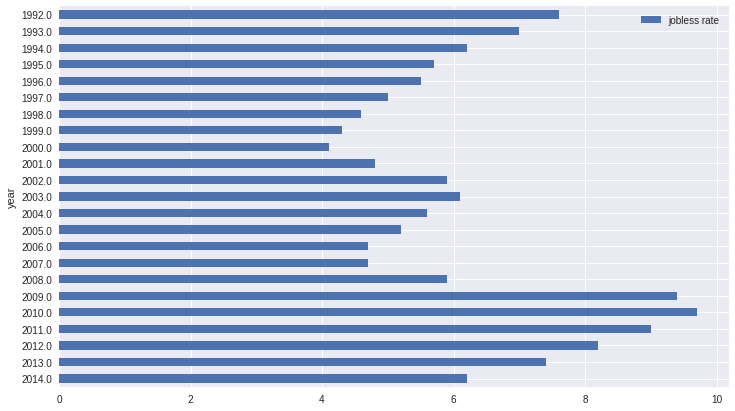

In [76]:
dfjob.plot(x='year', y='jobless rate', figsize=(12, 7), kind='barh') 

In [77]:
#Export data and create hv table 

table = hv.Table(dfjob, 'year', 'jobless rate')
table

:Table   [year]   (jobless rate)

In [78]:
#Create interactive plot using holoviews

hv.Curve(table) + hv.Bars(table)

:Layout
   .Curve.I :Curve   [year]   (jobless rate)
   .Bars.I  :Bars   [year]   (jobless rate)

In [79]:
#################################################################################################################################
################################################ MILESTONE PROJECT - PART 3 ######################################################

#1. Request API of stock ticker prices from Quandle WIKI dataset (two approaches with and without selection filters applied) 
#2. Convert jSon data to Pandas dataframe
#3. Create two separate dataframes, one for closing prices per ticker and another one for closing, opening, adjusted closing and adjusted openening prices per ticker  
#4. Analyze prices data since last month 
#5. Create table and plot data (Bokeh, Holoviews)


In [80]:
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
matplotlib.rcParams['savefig.dpi'] = 144
import pandas as pd
import numpy as np

In [81]:
import simplejson as json
import urllib2
import requests
import ujson as json


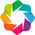

In [82]:
from bokeh.plotting import figure, show, output_notebook
from bokeh.resources import CDN
from bokeh.embed import file_html
from ipywidgets import interact
from bokeh.io import push_notebook
from matplotlib import cm
import holoviews as hv
hv.extension('bokeh', 'matplotlib')

In [83]:
#################################################################################################################################
#3.1. GENERAL API REQUEST

In [84]:
#Set url

url="https://www.quandl.com/api/v3/datatables/WIKI/PRICES.json?api_key=MhSyqwHb1N6rn5JiB7QF"

In [85]:
#Search request of ticker prices

r = requests.get('https://www.quandl.com/api/v3/datatables/WIKI/PRICES.json?api_key=MhSyqwHb1N6rn5JiB7QF')
r

<Response [200]>

In [86]:
#Return json file as python dict

ticker = r.json()

In [87]:
ticker_data=ticker['datatable']
ticker_data.keys()

[u'data', u'columns']

In [88]:
#See keys

ticker.keys()

[u'meta', u'datatable']

In [89]:
#FROM HERE ON
#################################################################################################################################
#FOLLOW A) OR B)

In [90]:
#################################################################################################################################

In [91]:
#3.1.A) OBTAIN A DATAFRAME OF CLOSING PRICES OF EACH TICKER FROM THE LAST MONTH 

#Select last  month prices

ticker_col=ticker_data['columns']
ticker1=ticker_data['data'][4557:4578]
ticker2=ticker_data['data'][4872:4893]
ticker3=ticker_data['data'][7981:8002]
ticker4=ticker_data['data'][9274:9292]

import pandas
df1=pandas.DataFrame.from_dict(ticker1, orient='columns')
df1.drop(df1.columns[[2,3,4,6,7,8,9,10,11,12,13]], axis=1, inplace=True)
df1.columns = ['Ticker', 'Date', 'Price']
df2=pandas.DataFrame.from_dict(ticker2, orient='columns')
df2.drop(df2.columns[[2,3,4,6,7,8,9,10,11,12,13]], axis=1, inplace=True)
df2.columns = ['Ticker', 'Date', 'Price']
df3=pandas.DataFrame.from_dict(ticker3, orient='columns')
df3.drop(df3.columns[[2,3,4,6,7,8,9,10,11,12,13]], axis=1, inplace=True)
df3.columns = ['Ticker', 'Date', 'Price']
df4=pandas.DataFrame.from_dict(ticker4, orient='columns')
df4.drop(df4.columns[[2,3,4,6,7,8,9,10,11,12,13]], axis=1, inplace=True)
df4.columns = ['Ticker', 'Date', 'Price']
dfs = [df1, df2, df3, df4]
dfs = pd.concat(dfs)

In [92]:
out=dfs.pivot(index= 'Date', columns='Ticker', values='Price')
out

Ticker,A,AA,AAL,AAMC
Date,,,,
2018-01-02,67.60,55.17,52.990,NaN
2018-01-03,69.32,54.50,52.330,77.9500
2018-01-04,68.80,54.70,52.670,80.2000
2018-01-05,69.90,54.09,52.650,80.2000
2018-01-08,70.05,55.00,52.130,80.2000
2018-01-09,71.77,54.20,52.080,79.0000
2018-01-10,70.79,56.17,53.780,79.0000
2018-01-11,70.80,56.91,56.420,79.9900
2018-01-12,71.73,56.76,58.470,NaN


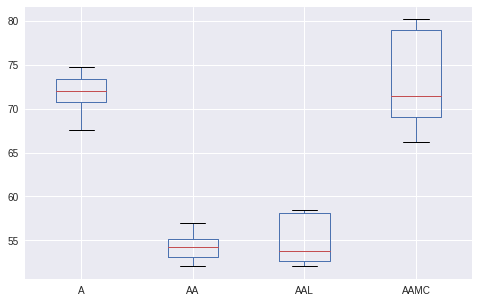

In [93]:
#Boxplot of each ticker type

out.plot.box(figsize=(8, 5))

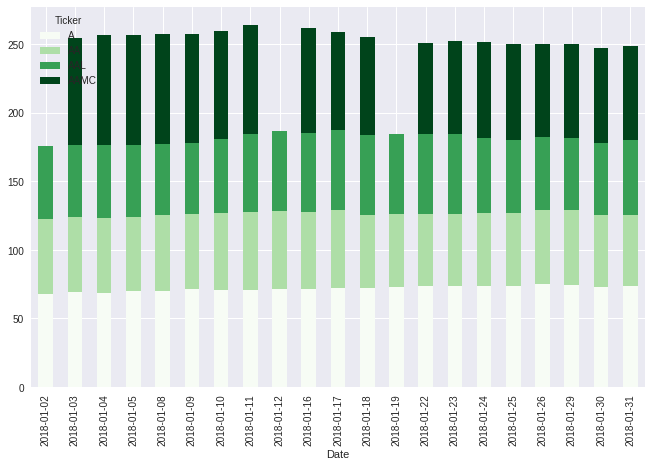

In [94]:
#Bar plots of Date per Ticker prices

out.plot.bar(colormap='Greens',stacked=True, figsize=(11, 7),legend='top_right')

In [95]:
#Plot closing prices for each ticker 

In [96]:
names = [('Price', 'Stock Input')]
ds = hv.Dataset(dfs, ['Date', 'Ticker'], names)

In [97]:
%%opts Curve [width=800 height=550] {+framewise}
ds.to(hv.Curve, 'Date','Price')

:HoloMap   [Ticker]
   :Curve   [Date]   (Price)

In [98]:
%%opts Bars [width=900 height=400 tools=['hover'] group_index=1 legend_position='top_right',bgcolor="white"]
Tickers = ['A', 'AA', 'AAL', 'AAMC']
ds.select(Ticker=Tickers).to(hv.Bars, ['Date','Ticker'], 'Price').sort()

:Bars   [Date,Ticker]   (Price)

In [99]:
%%opts Curve [width=200] (color='indianred')
Tickers = ['A', 'AA', 'AAL', 'AAMC']
grouped = ds.select(Ticker=Tickers).to(hv.Curve, 'Date', 'Price')
grouped.grid('Ticker')

:GridSpace   [Ticker]
   :Curve   [Date]   (Price)

In [100]:
%%opts Curve [width=600] (color=Cycle(values=['indianred', 'slateblue', 'lightseagreen', 'coral']))
grouped.overlay('Ticker')


:NdOverlay   [Ticker]
   :Curve   [Date]   (Price)

In [101]:
#JUMP TO LINE 34 FOR ADDITIONAL SUMMARY STATISTICS AND GRAPH VISUALIZATION

In [102]:
#################################################################################################################################

In [114]:
#3.1.B) OBTAIN A DATAFRAME OF CLOSING, OPENING, ADJUSTED CLOSING AND ADJUSTED OPENING PRICRES FROM THE LAST MONTH FOR EACH TICKER 

#Select last  month prices

ticker_col=ticker_data['columns']
ticker1=ticker_data['data'][4557:4578]
ticker2=ticker_data['data'][4872:4893]
ticker3=ticker_data['data'][7981:8002]
ticker4=ticker_data['data'][9274:9292]

import pandas
df1=pandas.DataFrame.from_dict(ticker1, orient='columns')
df1.drop(df1.columns[[3,4,6,7,8,10,11,13]], axis=1, inplace=True)
df1.columns = ['Ticker', 'Date', 'Open Price', 'Close Price','Adj Open Price', 'Adj Close Price']
df2=pandas.DataFrame.from_dict(ticker2, orient='columns')
df2.drop(df2.columns[[3,4,6,7,8,10,11,13]], axis=1, inplace=True)
df2.columns = ['Ticker', 'Date', 'Open Price', 'Close Price','Adj Open Price', 'Adj Close Price']
df3=pandas.DataFrame.from_dict(ticker3, orient='columns')
df3.drop(df3.columns[[3,4,6,7,8,10,11,13]], axis=1, inplace=True)
df3.columns = ['Ticker', 'Date', 'Open Price', 'Close Price','Adj Open Price', 'Adj Close Price']
df4=pandas.DataFrame.from_dict(ticker4, orient='columns')
df4.drop(df4.columns[[3,4,6,7,8,10,11,13]], axis=1, inplace=True)
df4.columns = ['Ticker', 'Date', 'Open Price', 'Close Price','Adj Open Price', 'Adj Close Price']
dfs = [df1, df2, df3, df4]
dfs = pd.concat(dfs)
dfs


,Ticker,Date,Open Price,Close Price,Adj Open Price,Adj Close Price
0,A,2018-01-02,67.4200,67.6000,67.4200,67.6000
1,A,2018-01-03,67.6200,69.3200,67.6200,69.3200
2,A,2018-01-04,69.5400,68.8000,69.5400,68.8000
3,A,2018-01-05,68.7300,69.9000,68.7300,69.9000
4,A,2018-01-08,69.7300,70.0500,69.7300,70.0500
5,A,2018-01-09,70.6800,71.7700,70.6800,71.7700
6,A,2018-01-10,71.4500,70.7900,71.4500,70.7900
7,A,2018-01-11,70.9200,70.8000,70.9200,70.8000
8,A,2018-01-12,70.7300,71.7300,70.7300,71.7300
9,A,2018-01-16,72.0200,71.2300,72.0200,71.2300


In [115]:
#Create a new dataframe 'Date' from previous dataframe that will be used as an index

dfsd=dfs.loc[:, 'Date']
dfsd1=dfsd.drop_duplicates()
dfsd1

0     2018-01-02
1     2018-01-03
2     2018-01-04
3     2018-01-05
4     2018-01-08
5     2018-01-09
6     2018-01-10
7     2018-01-11
8     2018-01-12
9     2018-01-16
10    2018-01-17
11    2018-01-18
12    2018-01-19
13    2018-01-22
14    2018-01-23
15    2018-01-24
16    2018-01-25
17    2018-01-26
18    2018-01-29
19    2018-01-30
20    2018-01-31
Name: Date, dtype: object

In [116]:
#Re-order the columns in the dataframe:

#1.  Assign multi-index columns from tuples

multicols = pd.MultiIndex.from_tuples([('A','Open Price'),('A','Close Price'),('A','Adj Open Price'),('A','Adj Close Price'),
                                       ('AA','Open Price'),('AA','Close Price'),('AA','Adj Open Price'),('AA','Adj Close Price'),
                                       ('AAL','Open Price'),('AAL','Close Price'),('AAL','Adj Open Price'),('AAL','Adj Close Price'),
                                       ('AAMC','Open Price'),('AAMC','Close Price'),('AAMC','Adj Open Price'),('AAMC','Adj Close Price')],
                                       names=['Ticker', 'Price'])

#2. Create an empty dataframe using the former newly created 'Date' index and the multi-index columns from step 1

index = dfsd1
out = pd.DataFrame(index=index,columns=multicols).sort_index().sort_index(axis=1)
out

Ticker                   A                                        \
Price      Adj Close Price Adj Open Price Close Price Open Price   
Date                                                               
2018-01-02             NaN            NaN         NaN        NaN   
2018-01-03             NaN            NaN         NaN        NaN   
2018-01-04             NaN            NaN         NaN        NaN   
2018-01-05             NaN            NaN         NaN        NaN   
2018-01-08             NaN            NaN         NaN        NaN   
2018-01-09             NaN            NaN         NaN        NaN   
2018-01-10             NaN            NaN         NaN        NaN   
2018-01-11             NaN            NaN         NaN        NaN   
2018-01-12             NaN            NaN         NaN        NaN   
2018-01-16             NaN            NaN         NaN        NaN   
2018-01-17             NaN            NaN         NaN        NaN   
2018-01-18             NaN            NaN         NaN        NaN   
2018-01-19             NaN            NaN         NaN        NaN   
2018-01-22             NaN            NaN         NaN        NaN   
2018-01-23             NaN            NaN         NaN        NaN   
2018-01-24             NaN            NaN         NaN        NaN   
2018-01-25             NaN            NaN         NaN        NaN   
2018-01-26             NaN            NaN         NaN        NaN   
2018-01-29             NaN            NaN         NaN        NaN   
2018-01-30             NaN            NaN         NaN        NaN   
2018-01-31             NaN            NaN         NaN        NaN   

Ticker                  AA                                        \
Price      Adj Close Price Adj Open Price Close Price Open Price   
Date                                                               
2018-01-02             NaN            NaN         NaN        NaN   
2018-01-03             NaN            NaN         NaN        NaN   
2018-01-04             NaN            NaN         NaN        NaN   
2018-01-05             NaN            NaN         NaN        NaN   
2018-01-08             NaN            NaN         NaN        NaN   
2018-01-09             NaN            NaN         NaN        NaN   
2018-01-10             NaN            NaN         NaN        NaN   
2018-01-11             NaN            NaN         NaN        NaN   
2018-01-12             NaN            NaN         NaN        NaN   
2018-01-16             NaN            NaN         NaN        NaN   
2018-01-17             NaN            NaN         NaN        NaN   
2018-01-18             NaN            NaN         NaN        NaN   
2018-01-19             NaN            NaN         NaN        NaN   
2018-01-22             NaN            NaN         NaN        NaN   
2018-01-23             NaN            NaN         NaN        NaN   
2018-01-24             NaN            NaN         NaN        NaN   
2018-01-25             NaN            NaN         NaN        NaN   
2018-01-26             NaN            NaN         NaN        NaN   
2018-01-29             NaN            NaN         NaN        NaN   
2018-01-30             NaN            NaN         NaN        NaN   
2018-01-31             NaN            NaN         NaN        NaN   

Ticker                 AAL                                        \
Price      Adj Close Price Adj Open Price Close Price Open Price   
Date                                                               
2018-01-02             NaN            NaN         NaN        NaN   
2018-01-03             NaN            NaN         NaN        NaN   
2018-01-04             NaN            NaN         NaN        NaN   
2018-01-05             NaN            NaN         NaN        NaN   
2018-01-08             NaN            NaN         NaN        NaN   
2018-01-09             NaN            NaN         NaN        NaN   
2018-01-10             NaN            NaN         NaN        NaN   
2018-01-11             NaN            NaN         NaN 

In [118]:
#3. Create another dataframe based on the combined dataframes (1,2,3,4, dfs) containing the actual values of ticker prices

#Group columns  by 'Ticker' name, pivot column index rows to column and imputate missing cases

dfill = (dfs.groupby('Ticker').apply(lambda g:g.set_index('Date') [['Open Price', 'Close Price', 'Adj Open Price', 'Adj Close Price']]).unstack(level=0).fillna(dfs['Close Price'].mean()))

#Delete column and adjust the multi-index column 

dfill.columns=dfill.columns.droplevel()  
print dfill


Ticker          A     AA    AAL       AAMC      A     AA     AAL       AAMC  \
Date                                                                          
2018-01-02  67.42  54.06  52.33  63.298085  67.60  55.17  52.990  63.298085   
2018-01-03  67.62  54.92  52.86  77.950000  69.32  54.50  52.330  77.950000   
2018-01-04  69.54  54.81  52.48  80.200000  68.80  54.70  52.670  80.200000   
2018-01-05  68.73  54.65  52.78  80.200000  69.90  54.09  52.650  80.200000   
2018-01-08  69.73  53.96  52.60  80.200000  70.05  55.00  52.130  80.200000   
2018-01-09  70.68  55.00  52.97  79.000000  71.77  54.20  52.080  79.000000   
2018-01-10  71.45  54.37  53.23  79.000000  70.79  56.17  53.780  79.000000   
2018-01-11  70.92  56.60  54.49  79.990000  70.80  56.91  56.420  79.990000   
2018-01-12  70.73  57.05  56.56  63.298085  71.73  56.76  58.470  63.298085   
2018-01-16  72.02  56.09  58.79  75.950000  71.23  56.24  57.985  75.950000   
2018-01-17  71.72  56.03  58.31  71.501000  72.06  5

In [119]:
#Reset the indices of the two dataframes

out = out.reset_index(drop=True)
dfill = dfill.reset_index(drop=True)

#Rebuild the empty dataframe

out = pd.DataFrame(out)

#Assign length of columns and copy price values within each price category and ticker from one to another dataframe

sLength = len(out['A'])
out['A']= dfill['A'].values
out['AA']= dfill['AA'].values
out['AAL']= dfill['AAL'].values
out['AAMC']= dfill['AAMC'].values


In [120]:
#Add the column 'Date' indexed in the dataframe

out['Date'] = dfsd1
out

Ticker               A                                                    AA  \
Price  Adj Close Price Adj Open Price Close Price Open Price Adj Close Price   
0                67.42          67.60       67.42      67.60           54.06   
1                67.62          69.32       67.62      69.32           54.92   
2                69.54          68.80       69.54      68.80           54.81   
3                68.73          69.90       68.73      69.90           54.65   
4                69.73          70.05       69.73      70.05           53.96   
5                70.68          71.77       70.68      71.77           55.00   
6                71.45          70.79       71.45      70.79           54.37   
7                70.92          70.80       70.92      70.80           56.60   
8                70.73          71.73       70.73      71.73           57.05   
9                72.02          71.23       72.02      71.23           56.09   
10               71.72          72.06       71.72      72.06           56.03   
11               72.20          72.19       72.20      72.19           53.67   
12               72.48          73.07       72.48      73.07           52.86   
13               73.17          73.48       73.17      73.48           52.80   
14               74.05          73.44       74.05      73.44           52.34   
15               73.66          73.58       73.66      73.58           52.90   
16               74.17          73.86       74.17      73.86           53.74   
17               74.30          74.82       74.30      74.82           53.55   
18               74.48          74.53       74.48      74.53           53.89   
19               73.99          72.99       73.99      72.99           53.67   
20               73.77          73.43       73.77      73.43           52.75   

Ticker                                                   AAL                 \
Price  Adj Open Price Close Price Open Price Adj Close Price Adj Open Price   
0               55.17       54.06      55.17           52.33         52.990   
1               54.50       54.92      54.50           52.86         52.330   
2               54.70       54.81      54.70           52.48         52.670   
3               54.09       54.65      54.09           52.78         52.650   
4               55.00       53.96      55.00           52.60         52.130   
5               54.20       55.00      54.20           52.97         52.080   
6               56.17       54.37      56.17           53.23         53.780   
7               56.91       56.60      56.91           54.49         56.420   
8               56.76       57.05      56.76           56.56         58.470   
9               56.24       56.09      56.24           58.79         57.985   
10              56.99       56.03      56.99           58.31         58.160   
11              53.00       53.67      53.00           58.00         58.340   
12              53.10       52.86      53.10           58.59         58.060   
13              52.94       52.80      52.94           57.99         58.100   
14              52.49       52.34      52.49           57.74         58.290   
15              53.30       52.90      53.30           54.35         54.790   
16              53.11       53.74      53.11           54.00         53.050   
17              54.00       53.55      54.00           53.65         53.070   
18              54.49       53.89      54.49           52.79         52.680   
19              52.52       53.67      52.52           52.45         52.590   
20              52.02       52.75      52.02           53.08         54.320   

Ticker                                   AAMC                             \
Price  Close Price Open Price Adj Close Price Adj Open Price Close Price   
0            52.33     52.990       63.298085      63.298085   63.298085   
1            52.86     52.330       77.950000      77.950000   77.950000   
2            52.48     52.670       8

In [121]:
out.describe()

Ticker               A                                                    AA  \
Price  Adj Close Price Adj Open Price Close Price Open Price Adj Close Price   
count        21.000000      21.000000   21.000000  21.000000       21.000000   
mean         71.753810      71.878095   71.753810  71.878095       54.271905   
std           2.208258       1.963269    2.208258   1.963269        1.319730   
min          67.420000      67.600000   67.420000  67.600000       52.340000   
25%          70.680000      70.790000   70.680000  70.790000       53.550000   
50%          72.020000      72.060000   72.020000  72.060000       53.960000   
75%          73.770000      73.440000   73.770000  73.440000       54.920000   
max          74.480000      74.820000   74.480000  74.820000       57.050000   

Ticker                                                   AAL                 \
Price  Adj Open Price Close Price Open Price Adj Close Price Adj Open Price   
count       21.000000   21.000000  21.000000       21.000000      21.000000   
mean        54.366667   54.271905  54.366667       54.763810      54.902619   
std          1.548106    1.319730   1.548106        2.444354       2.581703   
min         52.020000   52.340000  52.020000       52.330000      52.080000   
25%         53.100000   53.550000  53.100000       52.790000      52.670000   
50%         54.200000   53.960000  54.200000       53.650000      53.780000   
75%         55.170000   54.920000  55.170000       57.740000      58.060000   
max         56.990000   57.050000  56.990000       58.790000      58.470000   

Ticker                                   AAMC                             \
Price  Close Price Open Price Adj Close Price Adj Open Price Close Price   
count    21.000000  21.000000       21.000000      21.000000   21.000000   
mean     54.763810  54.902619       72.086907      72.044960   72.086907   
std       2.444354   2.581703        6.100375       6.135201    6.100375   
min      52.330000  52.080000       63.298085      63.298085   63.298085   
25%      52.790000  52.670000       67.900000      68.150000   67.900000   
50%      53.650000  53.780000       69.664700      69.664700   69.664700   
75%      57.740000  58.060000       79.000000      79.000000   79.000000   
max      58.790000  58.470000       80.200000      80.200000   80.200000   

Ticker             
Price  Open Price  
count   21.000000  
mean    72.044960  
std      6.135201  
min     63.298085  
25%     68.150000  
50%     69.664700  
75%     79.000000  
max     80.200000

In [122]:
out.columns

MultiIndex(levels=[[u'A', u'AA', u'AAL', u'AAMC', u'Date'], [u'Adj Close Price', u'Adj Open Price', u'Close Price', u'Open Price', u'']],
           labels=[[0, 0, 0, 0, 1, 1, 1, 1, 2, 2, 2, 2, 3, 3, 3, 3, 4], [0, 1, 2, 3, 0, 1, 2, 3, 0, 1, 2, 3, 0, 1, 2, 3, 4]],
           names=[u'Ticker', u'Price'])

In [123]:
#FROM HERE ON THE RESULTS CHANGE DEPENDING ON WHETHER YOU CHOSE 3.1.A, 3.1.B!!!!!
################################################################################################################################
#RESULTS SUMMARY STATISTICS AND DATA PLOT

In [124]:
#Show summary statistics 

print out.describe()

#Calculate/plot mean-error values of each Ticker   

mean = out.mean()
error = out.std()
mean
error

Ticker               A                                                    AA  \
Price  Adj Close Price Adj Open Price Close Price Open Price Adj Close Price   
count        21.000000      21.000000   21.000000  21.000000       21.000000   
mean         71.753810      71.878095   71.753810  71.878095       54.271905   
std           2.208258       1.963269    2.208258   1.963269        1.319730   
min          67.420000      67.600000   67.420000  67.600000       52.340000   
25%          70.680000      70.790000   70.680000  70.790000       53.550000   
50%          72.020000      72.060000   72.020000  72.060000       53.960000   
75%          73.770000      73.440000   73.770000  73.440000       54.920000   
max          74.480000      74.820000   74.480000  74.820000       57.050000   

Ticker                                                   AAL                 \
Price  Adj Open Price Close Price Open Price Adj Close Price Adj Open Price   
count       21.000000   21.000000  21.000

Ticker  Price          
A       Adj Close Price    2.208258
        Adj Open Price     1.963269
        Close Price        2.208258
        Open Price         1.963269
AA      Adj Close Price    1.319730
        Adj Open Price     1.548106
        Close Price        1.319730
        Open Price         1.548106
AAL     Adj Close Price    2.444354
        Adj Open Price     2.581703
        Close Price        2.444354
        Open Price         2.581703
AAMC    Adj Close Price    6.100375
        Adj Open Price     6.135201
        Close Price        6.100375
        Open Price         6.135201
dtype: float64

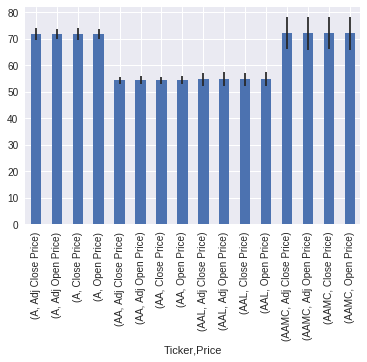

In [125]:
#Mean+Error bar plot

fig, ax = plt.subplots()
mean.plot.bar(yerr=error, ax=ax)

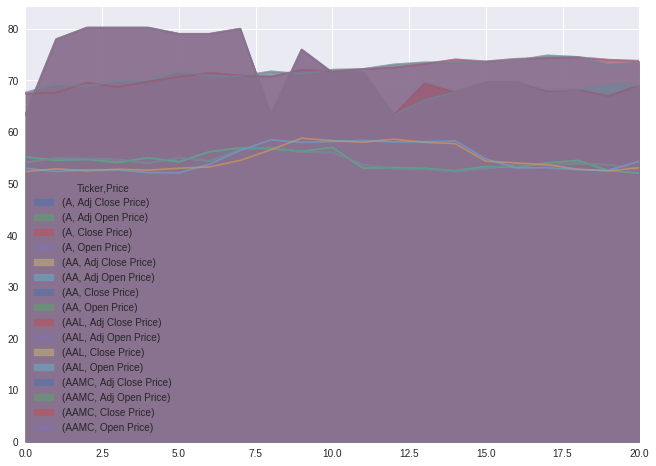

In [126]:
out.plot.area(stacked=False,figsize=(11, 8))

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7fea91f280d0>,
       <matplotlib.axes._subplots.AxesSubplot object at 0x7fea917c3590>], dtype=object)

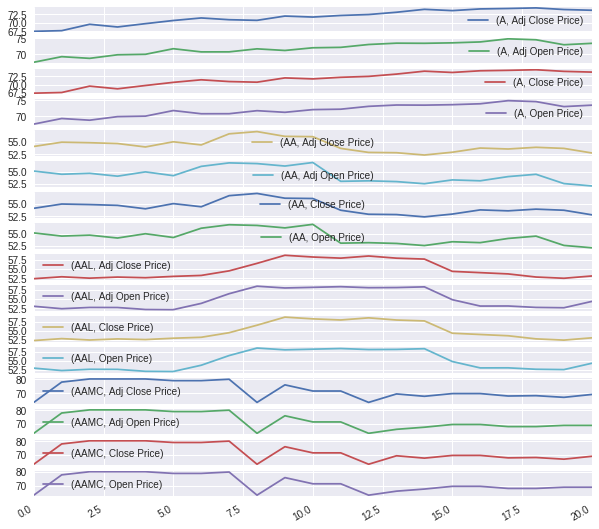

In [127]:
out.plot(subplots=True, figsize=(10, 10))

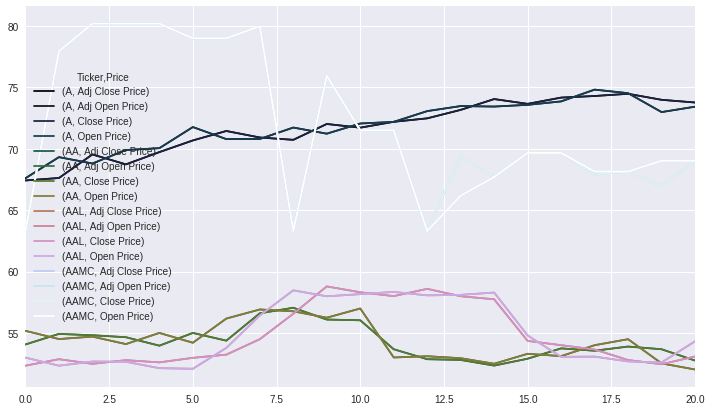

In [128]:
plt.figure()
out.plot(colormap=cm.cubehelix,figsize=(12, 7))

In [129]:
output_notebook()

Loading BokehJS ...

In [130]:
################################################################################################################################
#3.2.SPECIFIC API REQUEST (Filter by columns 'date', 'ticker' and ticker prices)

In [131]:
%matplotlib inline
import matplotlib
import seaborn as sns
matplotlib.rcParams['savefig.dpi'] = 144

In [132]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import simplejson as json
import urllib2
import requests
import ujson as json



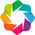

In [133]:
from bokeh.plotting import figure
from bokeh.resources import CDN
from bokeh.embed import file_html
from matplotlib import cm
import holoviews as hv
hv.extension('bokeh', 'matplotlib')

In [152]:
#Either use:

#3.2.1.A) 

import quandl
quandl.ApiConfig.api_key = 'MhSyqwHb1N6rn5JiB7QF'
dfs=quandl.get_table('WIKI/PRICES',qopts={'columns': ['date','ticker','open','close','adj_open','adj_close']},date='2018-1-1,2018-1-2,2018-1-3,2018-1-4,2018-1-5,2018-1-6,2018-1-7,2018-1-8,2018-1-9,2018-1-10,2018-1-11,2018-1-12,2018-1-13,2018-1-14,2018-1-15,2018-1-16,2018-1-17,2018-1-18,2018-1-19,2018-1-20,2018-1-21,2018-1-22,2018-1-23,2018-1-24,2018-1-25,2018-1-26,2018-1-27,2018-1-28,2018-1-29,2018-1-30,2018-1-31')

#For closing prices only alternatively you can use:
#dfs=quandl.get_table('WIKI/PRICES',qopts={'columns': ['date','ticker','close']},date='2018-1-1,2018-1-2,2018-1-3,2018-1-4,2018-1-5,2018-1-6,2018-1-7,2018-1-8,2018-1-9,2018-1-10,2018-1-11,2018-1-12,2018-1-13,2018-1-14,2018-1-15,2018-1-16,2018-1-17,2018-1-18,2018-1-19,2018-1-20,2018-1-21,2018-1-22,2018-1-23,2018-1-24,2018-1-25,2018-1-26,2018-1-27,2018-1-28,2018-1-29,2018-1-30,2018-1-31')

#or

#3.2.1.B)

#r = requests.get('https://www.quandl.com/api/v3/datatables/WIKI/PRICES.json?qopts.columns=ticker,date,open,close,adj_open,adj_close&date=2018-1-1,2018-1-2,2018-1-3,2018-1-4,2018-1-5,2018-1-6,2018-1-7,2018-1-8,2018-1-9,2018-1-10,2018-1-11,2018-1-12,2018-1-13,2018-1-14,2018-1-15,2018-1-16,2018-1-17,2018-1-18,2018-1-19,2018-1-20,2018-1-21,2018-1-22,2018-1-23,2018-1-24,2018-1-25,2018-1-26,2018-1-27,2018-1-28,2018-1-29,2018-1-30,2018-1-31&api_key=MhSyqwHb1N6rn5JiB7QF')
#qt = r.json() 

In [135]:
#From here on follow 3.2.1 or 3.2.2 approaches 
#################################################################################################################################

In [136]:
###########3.2.1. This method will result in four plots for each of the price values contained in the requested data

In [137]:
#Rename columns

dfs.columns = ['Date','Ticker','Open Price','Close Price','Adj Open Price','Adj Close Price']

#For search selection filtered only by closing prices use:

#dfs.columns = ['Date','Ticker','Price']
#out=dfs.pivot(index= 'Date', columns='Ticker', values='Price')

In [138]:
#Make four copies of the dataframe and drop columns by price values

dfs_open=dfs.copy(deep=True)
dfs_close=dfs.copy(deep=True)
dfs_adj_open=dfs.copy(deep=True)
dfs_adj_close=dfs.copy(deep=True)
dfs_open=dfs_open.drop(dfs_open.columns[[3, 4, 5]], axis=1)
dfs_close=dfs_close.drop(dfs_close.columns[[2, 4, 5]], axis=1)
dfs_adj_open=dfs_adj_open.drop(dfs_adj_open.columns[[2, 3, 5]], axis=1)
dfs_adj_close=dfs_adj_close.drop(dfs_adj_close.columns[[2, 3, 4]], axis=1)  

In [139]:
#Assign Y names

names = [('Open Price', 'Open Price')]
ds_open = hv.Dataset(dfs_open, ['Date', 'Ticker'], names)
names = [('Close Price', 'Close Price')]
ds_close = hv.Dataset(dfs_close, ['Date', 'Ticker'], names)
names = [('Adj Open Price', 'Adj Open Price')]
ds_adj_open = hv.Dataset(dfs_adj_open, ['Date', 'Ticker'], names)
names = [('Adj Close Price', 'Adj Close Price')]
ds_adj_close = hv.Dataset(dfs_adj_close, ['Date', 'Ticker'], names)

In [140]:
#Plot open prices for each ticker   

In [141]:
%%opts Curve [width=800 height=550] {+framewise}
%%opts Curve (color='red' line_width=1.5)
ds_open.to(hv.Curve, 'Date','Open Price',label='Last month opening ticker prices')

:HoloMap   [Ticker]
   :Curve   [Date]   (Open Price)

In [142]:
#Plot closing prices for each ticker  

In [143]:
%%opts Curve [width=800 height=550] {+framewise}
%%opts Curve (color='blue' line_width=1.5)
ds_close.to(hv.Curve, 'Date','Close Price',label='Last month closing ticker prices')

:HoloMap   [Ticker]
   :Curve   [Date]   (Close Price)

In [144]:
#Plot adjusted open prices for each ticker   

In [145]:
%%opts Curve [width=800 height=550] {+framewise}
%%opts Curve (color='green' line_width=1.5)
ds_adj_open.to(hv.Curve, 'Date','Adj Open Price',label='Last month adjusted opening ticker prices')

:HoloMap   [Ticker]
   :Curve   [Date]   (Adj Open Price)

In [146]:
#Plot adjusted closing prices for each ticker   

In [147]:
%%opts Curve [width=800 height=550] {+framewise}
%%opts Curve (color='yellow' line_width=1.5)
ds_adj_close.to(hv.Curve, 'Date','Adj Close Price',label='Last month adjusted closing ticker prices')

:HoloMap   [Ticker]
   :Curve   [Date]   (Adj Close Price)

In [148]:
###########3.2.2. This method aims to categorize a dataframe containing all the prices and tickers for subsequent graph contruction

In [153]:
#Create a new dataframe 'date' from previous dataframe that will be used as an index

dfsd=dfs.loc[:, 'date']
dfsd1=dfsd.drop_duplicates()
dfsd1

None
0    2018-01-02
1    2018-01-03
2    2018-01-04
3    2018-01-05
4    2018-01-08
5    2018-01-09
6    2018-01-10
7    2018-01-11
8    2018-01-12
9    2018-01-16
10   2018-01-17
11   2018-01-18
12   2018-01-19
13   2018-01-22
14   2018-01-23
15   2018-01-24
16   2018-01-25
17   2018-01-26
18   2018-01-29
19   2018-01-30
20   2018-01-31
Name: date, dtype: datetime64[ns]

In [158]:
#Create a new dataframe using grouping variables 'ticker' and 'prices' and indexed by date. Imputate missing cases with closing prices mean

outg = (dfs.groupby('ticker').apply(lambda g:g.set_index('date')[['open','close','adj_open','adj_close']]).unstack(level=0).fillna(dfs['close'].mean()))

#Delete column and adjust the multi-index column 

print outg


             open                                                         \
ticker          A     AA    AAL        AAMC    AAN   AAOI   AAON     AAP   
date                                                                       
2018-01-02  67.42  54.06  52.33  724.662246  39.81  37.80  36.95  100.90   
2018-01-03  67.62  54.92  52.86   77.950000  39.43  38.27  36.95  106.42   
2018-01-04  69.54  54.81  52.48   80.200000  39.98  37.95  37.70  107.75   
2018-01-05  68.73  54.65  52.78   80.200000  39.85  38.70  37.55  111.96   
2018-01-08  69.73  53.96  52.60   80.200000  39.83  38.90  37.95  112.05   
2018-01-09  70.68  55.00  52.97   79.000000  40.82  38.14  37.45  111.69   
2018-01-10  71.45  54.37  53.23   79.000000  40.09  35.04  36.90  110.27   
2018-01-11  70.92  56.60  54.49   79.990000  39.16  35.37  36.15  110.70   
2018-01-12  70.73  57.05  56.56  724.662246  41.19  36.31  36.40  114.38   
2018-01-16  72.02  56.09  58.79   75.950000  41.54  35.69  36.75  116.76   
2018-01-17  

In [159]:
#Remove index 
outg = outg.reset_index(drop=True)

#Add the previously generated dataframe index to the final dataframe

outg['date'] = dfsd1

#View the final table 

outg

open                                                                  \
ticker      A     AA    AAL        AAMC    AAN   AAOI   AAON     AAP     AAPL   
0       67.42  54.06  52.33  724.662246  39.81  37.80  36.95  100.90  170.160   
1       67.62  54.92  52.86   77.950000  39.43  38.27  36.95  106.42  172.530   
2       69.54  54.81  52.48   80.200000  39.98  37.95  37.70  107.75  172.540   
3       68.73  54.65  52.78   80.200000  39.85  38.70  37.55  111.96  173.440   
4       69.73  53.96  52.60   80.200000  39.83  38.90  37.95  112.05  174.350   
5       70.68  55.00  52.97   79.000000  40.82  38.14  37.45  111.69  174.550   
6       71.45  54.37  53.23   79.000000  40.09  35.04  36.90  110.27  173.160   
7       70.92  56.60  54.49   79.990000  39.16  35.37  36.15  110.70  174.590   
8       70.73  57.05  56.56  724.662246  41.19  36.31  36.40  114.38  176.180   
9       72.02  56.09  58.79   75.950000  41.54  35.69  36.75  116.76  177.900   
10      71.72  56.03  58.31   71.501000  41.48  34.00  36.30  114.74  176.150   
11      72.20  53.67  58.00   71.501000  40.42  33.73  36.25  115.67  179.370   
12      72.48  52.86  58.59  724.662246  40.60  34.87  36.10  116.24  178.610   
13      73.17  52.80  57.99   69.400000  42.08  34.98  37.20  116.88  177.300   
14      74.05  52.34  57.74   67.700000  42.30  34.42  36.30  117.74  177.300   
15      73.66  52.90  54.35   69.650000  41.19  34.92  36.20  119.26  177.250   
16      74.17  53.74  54.00   69.664700  41.80  34.32  36.10  121.12  174.505   
17      74.30  53.55  53.65   67.900000  41.86  34.91  36.20  123.34  172.000   
18      74.48  53.89  52.79   68.150000  42.50  34.63  36.10  123.52  170.160   
19      73.99  53.67  52.45   66.950000  41.39  32.74  36.00  121.57  165.525   
20      73.77  52.75  53.08   69.024100  42.13  33.01  36.20  119.86  166.870   

                 ...     adj_close                                      \
ticker    AAT    ...           CLW     CLX    CMA    CMC   CMCO  CMCSA   
0       38.30    ...         46.20  144.99  86.57  22.77  41.15  41.07   
1       38.19    ...         46.15  143.43  86.54  24.30  40.81  40.41   
2       37.81    ...         46.80  145.69  87.51  24.48  40.66  40.67   
3       37.15    ...         48.40  145.73  88.47  24.90  40.28  41.04   
4       37.11    ...         49.80  146.44  88.72  25.28  41.38  40.48   
5       37.20    ...         50.15  146.16  90.37  25.04  43.54  40.61   
6       36.37    ...         49.35  144.43  91.31  25.27  42.60  41.09   
7       36.36    ...         50.30  141.99  92.52  25.82  43.00  42.60   
8       36.34    ...         49.40  140.96  93.04  25.16  42.91  42.44   
9       36.16    ...         47.85  142.41  93.79  24.59  42.47  41.82   
10      36.18    ...         49.20  144.32  94.76  24.84  42.82  41.68   
11      36.27    ...         49.20  143.14  93.81  25.09  42.79  41.85   
12      35.73    ...         50.25  143.86  94.99  24.82  44.42  42.50   
13      36.22    ...         49.50  144.48  95.21  25.02  44.25  42.89   
14      36.40    ...         49.05  143.52  95.25  24.88  43.17  42.44   
15      36.61    ...         48.30  142.25  95.53  24.99  42.57  42.99   
16      36.24    ...         47.60  146.13  94.70  24.87  42.44  42.14   
17      36.25    ...         47.35  142.64  95.81  25.27  42.05  42.80   
18      35.63    ...         46.90  140.96  95.15  25.26  41.81  41.98   
19      34.90    ...         47.60  141.76  94.76  24.55  41.41  42.34   
20      34.99    ...         47.05  141.69  95.22  24.04  40.95  42.53   

                                         date  
ticker     CME     CMG         CMI             
0       144.79  292.95  177.060000 2018-01-02  
1       147.11  309.00  179.010000 2018-01-03  
2       148.68  307.11  181.750000 2018-01-04  
3       149.65  313.79  181.460000 2018-01-05  
4       151.73  318.47  182.120000 2018-01-08  
5       152.63  319.37  181.960000 2018-01-09  
6       152.90  321.80  180.560000 2018-01-10  
7       15

In [160]:
#See elements ordered

sorted(outg)

[(u'adj_close', u'A'),
 (u'adj_close', u'AA'),
 (u'adj_close', u'AAL'),
 (u'adj_close', u'AAMC'),
 (u'adj_close', u'AAN'),
 (u'adj_close', u'AAOI'),
 (u'adj_close', u'AAON'),
 (u'adj_close', u'AAP'),
 (u'adj_close', u'AAPL'),
 (u'adj_close', u'AAT'),
 (u'adj_close', u'AAWW'),
 (u'adj_close', u'ABAX'),
 (u'adj_close', u'ABBV'),
 (u'adj_close', u'ABC'),
 (u'adj_close', u'ABCB'),
 (u'adj_close', u'ABG'),
 (u'adj_close', u'ABM'),
 (u'adj_close', u'ABMD'),
 (u'adj_close', u'ABT'),
 (u'adj_close', u'ACAD'),
 (u'adj_close', u'ACC'),
 (u'adj_close', u'ACCO'),
 (u'adj_close', u'ACET'),
 (u'adj_close', u'ACGL'),
 (u'adj_close', u'ACHC'),
 (u'adj_close', u'ACHN'),
 (u'adj_close', u'ACIW'),
 (u'adj_close', u'ACLS'),
 (u'adj_close', u'ACM'),
 (u'adj_close', u'ACN'),
 (u'adj_close', u'ACOR'),
 (u'adj_close', u'ACRE'),
 (u'adj_close', u'ACRX'),
 (u'adj_close', u'ACTG'),
 (u'adj_close', u'ACXM'),
 (u'adj_close', u'ADBE'),
 (u'adj_close', u'ADC'),
 (u'adj_close', u'ADES'),
 (u'adj_close', u'ADI'),
 (u'

In [157]:
#Show summary statistics

print outg.describe()

             open                                                         \
ticker          A         AA        AAL        AAMC       AAN       AAOI   
count   21.000000  21.000000  21.000000   21.000000  21.00000  21.000000   
mean    71.753810  54.271905  54.763810  166.567502  40.92619  35.652381   
std      2.208258   1.319730   2.444354  233.518526   1.01858   1.897843   
min     67.420000  52.340000  52.330000   66.950000  39.16000  32.740000   
25%     70.680000  53.550000  52.790000   69.400000  39.98000  34.420000   
50%     72.020000  53.960000  53.650000   75.950000  41.19000  34.980000   
75%     73.770000  54.920000  57.740000   80.200000  41.80000  37.800000   
max     74.480000  57.050000  58.790000  724.662246  42.50000  38.900000   

                                                         ...      adj_close  \
ticker       AAON         AAP        AAPL        AAT     ...           CLVS   
count   21.000000   21.000000   21.000000  21.000000     ...      21.000000   
me